<a href="https://colab.research.google.com/github/vanmart/EDALLMSTraining/blob/main/EDALLMSTraining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Carga del dataset

# Obtención nombres de columnas y tipos de datos

# Análisis exploratorio de datos

In [48]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Carga del dataset (asegúrate de tener el archivo o subirlo a Colab)
# url = "https://www.kaggle.com/datasets/kanchana1990/llm-price-performance-tracker-march-2026"
df = pd.read_csv('llm_price_performance_tracker_2026-03-31.csv')

# Inspección básica
print("Primeras 5 filas:")
display(df.head())

print("\nInfo del dataset:")
display(df.info())

# Análisis preliminar de nulos
missing_data = df.isnull().sum()
print("\nValores nulos por columna:")
print(missing_data[missing_data > 0])

Primeras 5 filas:


,model_name,model_slug,provider,provider_slug,aa_id,aa_intelligence_index,aa_coding_index,aa_math_index,composite_benchmark,mmlu_pro,...,arena_elo_ci95,arena_votes,parameter_count,release_year,is_open_source,intelligence_per_dollar,price_performance_ratio,elo_benchmark_blend,speed_per_dollar,scrape_date
0,GPT-5.4 (xhigh),gpt-5-4,OpenAI,openai,a89c4b28-2d8c-456e-88ea-255fb51fd2b6,57.2,57.3,NaN,63.40,NaN,...,8.0,5618.0,500.0,2026.0,False,10.17,33.53,80.68,15.94,2026-03-31
1,Gemini 3.1 Pro Preview,gemini-3-1-pro-preview,Google,google,bbd93ebe-80da-4594-bb19-61e69d0331df,57.2,55.5,NaN,65.90,NaN,...,6.0,15809.0,NaN,2026.0,False,12.71,38.66,96.02,26.71,2026-03-31
2,GPT-5.3 Codex (xhigh),gpt-5-3-codex,OpenAI,openai,59b5b14b-5365-4ee7-824a-18a8e6309644,54.0,53.1,NaN,61.53,NaN,...,NaN,NaN,500.0,2026.0,False,11.22,34.96,NaN,19.01,2026-03-31
3,"Claude Opus 4.6 (Adaptive Reasoning, Max Effort)",claude-opus-4-6-adaptive,Anthropic,anthropic,53c98840-47af-49aa-94e6-469fb17e9a1b,53.0,48.1,NaN,59.40,NaN,...,NaN,NaN,NaN,2025.0,False,5.30,24.77,NaN,6.06,2026-03-31
4,"Claude Sonnet 4.6 (Adaptive Reasoning, Max Eff...",claude-sonnet-4-6-adaptive,Anthropic,anthropic,df8d14e0-3997-4e4d-b4ad-9c047acc9c69,51.7,50.9,NaN,54.77,NaN,...,NaN,NaN,NaN,2025.0,False,8.62,28.14,NaN,12.90,2026-03-31



Info del dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 453 entries, 0 to 452
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   model_name                453 non-null    object 
 1   model_slug                453 non-null    object 
 2   provider                  453 non-null    object 
 3   provider_slug             453 non-null    object 
 4   aa_id                     453 non-null    object 
 5   aa_intelligence_index     446 non-null    float64
 6   aa_coding_index           356 non-null    float64
 7   aa_math_index             268 non-null    float64
 8   composite_benchmark       433 non-null    float64
 9   mmlu_pro                  344 non-null    float64
 10  gpqa_diamond              424 non-null    float64
 11  humanitys_last_exam       420 non-null    float64
 12  livecodebench             342 non-null    float64
 13  scicode                   418 non-null    floa

None


Valores nulos por columna:
aa_intelligence_index         7
aa_coding_index              97
aa_math_index               185
composite_benchmark          20
mmlu_pro                    109
gpqa_diamond                 29
humanitys_last_exam          33
livecodebench               111
scicode                      35
math_500                    252
aime_2025                   259
input_cost_usd_per_1m       138
output_cost_usd_per_1m      138
blended_cost_usd_per_1m     138
output_tokens_per_second    174
time_to_first_token_s       174
time_to_first_answer_s      174
chatbot_arena_elo           407
arena_elo_ci95              407
arena_votes                 407
parameter_count             167
release_year                161
intelligence_per_dollar     156
price_performance_ratio     158
elo_benchmark_blend         407
speed_per_dollar            190
dtype: int64


# 2. Determinar variables numéricas y categóricas

In [49]:
# 1. Definir Target (será creado dinámicamente)
target = "Uso_Recomendado"

# 2. Variables Categóricas (Información descriptiva)
variables_categoricas = [
    "model_name", "model_slug", "provider", "provider_slug",
    "aa_id", "pricing_tier", "scrape_date"
]

# 3. Variables Booleanas (Se convertirán a 0/1)
variables_booleanas = ["is_open_source"]

# 4. Variables Numéricas (Limpia y sin duplicados)
variables_numericas = [
    "aa_intelligence_index", "aa_coding_index", "aa_math_index",
    "composite_benchmark", "mmlu_pro", "gpqa_diamond",
    "humanitys_last_exam", "livecodebench", "scicode",
    "math_500", "aime_2025", "input_cost_usd_per_1m",
    "output_cost_usd_per_1m", "blended_cost_usd_per_1m",
    "output_tokens_per_second", "time_to_first_token_s",
    "time_to_first_answer_s", "chatbot_arena_elo",
    "arena_elo_ci95", "arena_votes", "parameter_count",
    "release_year", "intelligence_per_dollar",
    "price_performance_ratio", "elo_benchmark_blend",
    "speed_per_dollar"
]

# Validación técnica
print(f"Total variables definidas categoricas: {len(variables_categoricas) + len(variables_numericas) + len(variables_booleanas)}")
# Verificamos si hay duplicados
print(f"¿Hay duplicados en numéricas?: {len(variables_numericas) != len(set(variables_numericas))}")

Total variables definidas categoricas: 34
¿Hay duplicados en numéricas?: False


PORCENTAGE DE VALORES NULOS POR CALUMNA

In [50]:
null_percentages = df.isnull().sum() / len(df) * 100
print("Porcentaje de valores nulos por columna:")
print(null_percentages.sort_values(ascending=False))

Porcentaje de valores nulos por columna:
chatbot_arena_elo           89.845475
elo_benchmark_blend         89.845475
arena_votes                 89.845475
arena_elo_ci95              89.845475
aime_2025                   57.174393
math_500                    55.629139
speed_per_dollar            41.942605
aa_math_index               40.838852
time_to_first_token_s       38.410596
output_tokens_per_second    38.410596
time_to_first_answer_s      38.410596
parameter_count             36.865342
release_year                35.540839
price_performance_ratio     34.878587
intelligence_per_dollar     34.437086
input_cost_usd_per_1m       30.463576
blended_cost_usd_per_1m     30.463576
output_cost_usd_per_1m      30.463576
livecodebench               24.503311
mmlu_pro                    24.061810
aa_coding_index             21.412804
scicode                      7.726269
humanitys_last_exam          7.284768
gpqa_diamond                 6.401766
composite_benchmark          4.415011
aa_intell

# 3.  Eliminar variables innecesarias

"Se procedió a la eliminación de columnas con nulos críticos y metadatos no predictivos para preservar la integridad del dataset. Se descartaron aa_id, model_slug, provider_slug y scrape_date por carecer de valor analítico o representar constantes. Asimismo, se eliminaron variables de Chatbot Arena (chatbot_arena_elo, elo_benchmark_blend, arena_votes, arena_elo_ci95) y benchmarks de alta complejidad (math_500, aime_2025), los cuales presentan una tasa de nulos cercana al 89.85%. Esta decisión técnica evita la pérdida masiva de registros y previene el descarte injustificado de modelos especializados que no han sido evaluados en pruebas extremas, garantizando así la retención de un mayor número de muestras para el entrenamiento."

In [51]:
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np

# --- 1. Definición robusta de la función de etiquetas ---
def asignar_categoria(row):
    # Calculamos promedios (pandas ignora NaNs automáticamente en .mean())
    c = row[['aa_coding_index', 'livecodebench']].mean()
    r = row[['aa_intelligence_index', 'mmlu_pro', 'gpqa_diamond']].mean()
    w = row[['humanitys_last_exam', 'scicode']].mean()

    categorias = {'Codificación': c, 'Razonamiento': r, 'Escritura': w}

    # Si todos los promedios son NaN, asignamos 'Razonamiento' por defecto (evita errores)
    if pd.isna(c) and pd.isna(r) and pd.isna(w):
        return 'Razonamiento'

    return max(categorias, key=categorias.get)

# --- 2. Agregando Crear la columna target
# Esto garantiza que el target exista siempre
df['Uso_Recomendado'] = df.apply(asignar_categoria, axis=1)

# --- 3. Limpieza de columnas (según los criterios técnicos definidos) ---
cols_a_eliminar = [
    'model_name', 'model_slug', 'provider_slug', 'aa_id', 'scrape_date',
    'math_500', 'aime_2025',
    'chatbot_arena_elo', 'arena_elo_ci95', 'arena_votes', 'elo_benchmark_blend',
    'output_tokens_per_second', 'time_to_first_token_s', 'time_to_first_answer_s'
]
df_limpio = df.drop(columns=cols_a_eliminar, errors='ignore').copy()

# --- 4. Codificación final ---
# Transformación del target y variables categóricas
le = LabelEncoder()
df_limpio['Uso_Recomendado'] = le.fit_transform(df_limpio['Uso_Recomendado'])

# Convertir pricing_tier mediante One-Hot Encoding
df_limpio = pd.get_dummies(df_limpio, columns=['pricing_tier'], drop_first=True)

# Convertir is_open_source a entero si existe
if 'is_open_source' in df_limpio.columns:
    df_limpio['is_open_source'] = df_limpio['is_open_source'].astype(int)

# --- 5. Verificación de éxito ---
print("Limpieza y codificación completadas.")
print(f"Dataset final: {df_limpio.shape[0]} registros y {df_limpio.shape[1]} columnas.")
print("Distribución final del Target:")
print(df_limpio['Uso_Recomendado'].value_counts())

Limpieza y codificación completadas.
Dataset final: 453 registros y 25 columnas.
Distribución final del Target:
Uso_Recomendado
0    284
1    169
Name: count, dtype: int64


"Con el fin de garantizar la integridad y robustez del dataset, se implementó un pipeline de limpieza y preprocesamiento en tres etapas. Primero, se eliminaron identificadores y metadatos no predictivos (aa_id, model_slug, etc.) por carecer de valor analítico. Segundo, se descartaron variables con tasas de nulos críticas superiores al 89% (ej. Chatbot Arena y benchmarks de alta complejidad como math_500), previniendo así una reducción drástica del tamaño de la muestra y asegurando la retención de modelos especializados que no han sido evaluados en pruebas extremas. Finalmente, los valores nulos restantes en las variables numéricas se gestionaron mediante imputación por la mediana, técnica que preserva la distribución estadística original y garantiza un dataset completo, apto para la ejecución de algoritmos de aprendizaje supervisado."

In [52]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer

# 1. Definición explícita de columnas a eliminar (Lista Exhaustiva)
# Se basa en el diagnóstico de: Alta tasa de nulos (>55%) y metadatos no predictivos.
cols_a_eliminar = [
    # Identificadores y metadatos (Sin valor predictivo)
    'model_name', 'model_slug', 'provider', 'provider_slug', 'aa_id', 'scrape_date',

    # Benchmarks con nulos > 50% (Críticos para la integridad estadística)
    'math_500', 'aime_2025',

    # Columnas de Chatbot Arena (90% nulos - Altamente sesgadas)
    'chatbot_arena_elo', 'arena_elo_ci95', 'arena_votes', 'elo_benchmark_blend',

    # Métricas de tiempo altamente incompletas
    'output_tokens_per_second', 'time_to_first_token_s', 'time_to_first_answer_s'
]

# 2. Ejecución de la limpieza
# Usamos errors='ignore' por seguridad en caso de que alguna columna ya haya sido eliminada
df_limpio = df.drop(columns=cols_a_eliminar, errors='ignore').copy()

# 3. Imputación profesional (Mediana) sobre las variables numéricas restantes
# Esto asegura que no queden nulos antes del entrenamiento
numeric_cols = df_limpio.select_dtypes(include=[np.number]).columns
imputer = SimpleImputer(strategy='median')

df_limpio[numeric_cols] = imputer.fit_transform(df_limpio[numeric_cols])

# 4. Verificación técnica de calidad
nulos_finales = df_limpio.isnull().sum().sum()
print(f"Limpieza completada.")
print(f"Variables restantes: {df_limpio.shape[1]}")
print(f"Total de valores nulos encontrados en el dataset final: {nulos_finales}")

if nulos_finales == 0:
    print("Estado: Dataset apto para Modelado.")
else:
    print("Alerta: Aún existen valores nulos. Revisar variables categóricas.")

Limpieza completada.
Variables restantes: 20
Total de valores nulos encontrados en el dataset final: 0
Estado: Dataset apto para Modelado.


# 5. Codificación de variables categóricas con LabelEncoder


In [53]:
# --- Paso: Codificación Final (Ejecuta esto después de limpiar e imputar) ---

# A. Codificar el Target (Uso_Recomendado)
le = LabelEncoder()
df_limpio['Uso_Recomendado'] = le.fit_transform(df_limpio['Uso_Recomendado'])

# B. Codificar Categóricas (One-Hot)
# Esto crea columnas nuevas (ej: pricing_tier_Free, pricing_tier_Paid)
df_limpio = pd.get_dummies(df_limpio, columns=['pricing_tier'], drop_first=True)

# C. Convertir booleanos a enteros (para que el modelo los lea como 0 o 1)
if 'is_open_source' in df_limpio.columns:
    df_limpio['is_open_source'] = df_limpio['is_open_source'].astype(int)

# Verificación de que todo es numérico
print("Tipos de datos después de la codificación:")
print(df_limpio.dtypes.value_counts())

Tipos de datos después de la codificación:
float64    17
bool        5
int64       2
Name: count, dtype: int64


# 6.Verificar tipos de datos

In [54]:
from sklearn.preprocessing import LabelEncoder

# 1. Verificación de tipos de datos antes de codificar
print("--- Tipos de datos en el dataset ---")
print(df_limpio.dtypes)
print("-" * 30)

# 2. Codificación del Target (Uso_Recomendado)
# Guardamos el encoder para poder revertir los nombres después si es necesario
le = LabelEncoder()
df_limpio['Uso_Recomendado'] = le.fit_transform(df_limpio['Uso_Recomendado'])

# 3. Validación de las clases codificadas
print("\n--- Mapeo de categorías ---")
for index, class_name in enumerate(le.classes_):
    print(f"Categoría '{class_name}' -> Codificada como: {index}")

# 4. Verificación final de que no queden objetos
print("\n--- Verificación: ¿Quedan columnas no numéricas? ---")
objetos_restantes = df_limpio.select_dtypes(include=['object']).columns
if len(objetos_restantes) == 0:
    print("Éxito: Todas las columnas son numéricas.")
else:
    print(f"Atención: Quedan columnas tipo objeto: {list(objetos_restantes)}")

--- Tipos de datos en el dataset ---
aa_intelligence_index      float64
aa_coding_index            float64
aa_math_index              float64
composite_benchmark        float64
mmlu_pro                   float64
gpqa_diamond               float64
humanitys_last_exam        float64
livecodebench              float64
scicode                    float64
input_cost_usd_per_1m      float64
output_cost_usd_per_1m     float64
blended_cost_usd_per_1m    float64
parameter_count            float64
release_year               float64
is_open_source               int64
intelligence_per_dollar    float64
price_performance_ratio    float64
speed_per_dollar           float64
Uso_Recomendado              int64
pricing_tier_Free             bool
pricing_tier_Mid              bool
pricing_tier_Premium          bool
pricing_tier_Ultra            bool
pricing_tier_Unknown          bool
dtype: object
------------------------------

--- Mapeo de categorías ---
Categoría '0' -> Codificada como: 0
Categoría '1'

In [55]:
# --- Paso 4: Codificación Final (Ajustada para ignorar columnas eliminadas) ---

print("--- Iniciando Codificación en df_limpio ---")
df_encoded = df_limpio.copy()

# A. Filtrar solo las categóricas que SOBREVIVIERON a la limpieza
# Esto evita que el código intente buscar columnas que ya borramos
cols_cat_existentes = [col for col in variables_categoricas if col in df_encoded.columns]

if len(cols_cat_existentes) > 0:
    df_encoded = pd.get_dummies(df_encoded, columns=cols_cat_existentes, drop_first=True)
    print(f"✅ Variables categóricas codificadas: {cols_cat_existentes}")

# B. Convertir booleanos a enteros (filtrando igual por seguridad)
cols_bool_existentes = [col for col in variables_booleanas if col in df_encoded.columns]

for col in cols_bool_existentes:
    df_encoded[col] = df_encoded[col].astype(int)
    print(f"✅ Columna booleana '{col}' convertida a entero.")

# C. Codificación final del Target
df_encoded['Uso_Recomendado'] = le.fit_transform(df_encoded['Uso_Recomendado'])
print("✅ Target 'Uso_Recomendado' codificado.")

# --- Verificación ---
print(f"\nProceso finalizado. Dataset final tiene {df_encoded.shape[1]} columnas.")
display(df_encoded.head())

--- Iniciando Codificación en df_limpio ---
✅ Columna booleana 'is_open_source' convertida a entero.
✅ Target 'Uso_Recomendado' codificado.

Proceso finalizado. Dataset final tiene 24 columnas.


,aa_intelligence_index,aa_coding_index,aa_math_index,composite_benchmark,mmlu_pro,gpqa_diamond,humanitys_last_exam,livecodebench,scicode,input_cost_usd_per_1m,...,is_open_source,intelligence_per_dollar,price_performance_ratio,speed_per_dollar,Uso_Recomendado,pricing_tier_Free,pricing_tier_Mid,pricing_tier_Premium,pricing_tier_Ultra,pricing_tier_Unknown
0,57.2,57.3,52.8,63.40,0.752,0.920,0.416,0.423,0.566,2.50,...,0,10.17,33.53,15.94,0,False,False,True,False,False
1,57.2,55.5,52.8,65.90,0.752,0.941,0.447,0.423,0.589,2.00,...,0,12.71,38.66,26.71,0,False,True,False,False,False
2,54.0,53.1,52.8,61.53,0.752,0.915,0.399,0.423,0.532,1.75,...,0,11.22,34.96,19.01,0,False,True,False,False,False
3,53.0,48.1,52.8,59.40,0.752,0.896,0.367,0.423,0.519,5.00,...,0,5.30,24.77,6.06,0,False,False,True,False,False
4,51.7,50.9,52.8,54.77,0.752,0.875,0.300,0.423,0.468,3.00,...,0,8.62,28.14,12.90,0,False,False,True,False,False


# 7. Descripción estadística
## 7.1 Para datos numéricos

In [56]:
# Define current_numerical_variables from the processed dataframe before scaling
# All columns in df_encoded except the target 'Uso_Recomendado'
current_numerical_variables = [col for col in df_encoded.columns if col != target]

# 1. Validación de integridad
# Use df_encoded as it is the most processed dataframe before the explicit scaling in the next steps.
desc = df_encoded[current_numerical_variables].describe().T
desc['missing_values'] = df_encoded[current_numerical_variables].isnull().sum() # Should be 0 after imputation

# 2. Diagnóstico de escala (identificar si necesitas escalado)
print("--- Diagnóstico de Variables Numéricas ---")
display(desc[['count', 'mean', 'min', 'max', 'missing_values']])

# 3. Alerta de escalado
for col in current_numerical_variables:
    if df_encoded[col].max() > 10: # Use df_encoded here
        print(f"⚠️ Alerta: La columna '{col}' tiene valores altos ({df_encoded[col].max()}). Considera usar StandardScaler.")

--- Diagnóstico de Variables Numéricas ---


,count,mean,min,max,missing_values
aa_intelligence_index,453.0,21.190397,4.700,57.200,0
aa_coding_index,453.0,18.895254,0.000,57.300,0
aa_math_index,453.0,51.355408,0.000,99.000,0
composite_benchmark,453.0,43.966358,4.100,95.400,0
mmlu_pro,453.0,0.709380,0.055,0.898,0
gpqa_diamond,453.0,0.598987,0.098,0.941,0
humanitys_last_exam,453.0,0.087003,0.012,0.447,0
livecodebench,453.0,0.439223,0.002,0.917,0
scicode,453.0,0.283187,0.000,0.589,0
input_cost_usd_per_1m,453.0,1.382274,0.000,150.000,0


⚠️ Alerta: La columna 'aa_intelligence_index' tiene valores altos (57.2). Considera usar StandardScaler.
⚠️ Alerta: La columna 'aa_coding_index' tiene valores altos (57.3). Considera usar StandardScaler.
⚠️ Alerta: La columna 'aa_math_index' tiene valores altos (99.0). Considera usar StandardScaler.
⚠️ Alerta: La columna 'composite_benchmark' tiene valores altos (95.4). Considera usar StandardScaler.
⚠️ Alerta: La columna 'input_cost_usd_per_1m' tiene valores altos (150.0). Considera usar StandardScaler.
⚠️ Alerta: La columna 'output_cost_usd_per_1m' tiene valores altos (600.0). Considera usar StandardScaler.
⚠️ Alerta: La columna 'blended_cost_usd_per_1m' tiene valores altos (262.5). Considera usar StandardScaler.
⚠️ Alerta: La columna 'parameter_count' tiene valores altos (1200.0). Considera usar StandardScaler.
⚠️ Alerta: La columna 'release_year' tiene valores altos (2026.0). Considera usar StandardScaler.
⚠️ Alerta: La columna 'intelligence_per_dollar' tiene valores altos (525.0).

In [57]:
from sklearn.preprocessing import StandardScaler

# 1. Instanciamos el escalador
scaler = StandardScaler()

# 2. Seleccionamos las columnas numéricas que tienen esas magnitudes grandes
# Excluimos las que ya están codificadas o que no necesitan escalado
cols_a_escalar = [col for col in df_encoded.columns if col not in ['Uso_Recomendado']]

# 3. Aplicamos el escalado
df_encoded[cols_a_escalar] = scaler.fit_transform(df_encoded[cols_a_escalar])

print("✅ Escalado completado. Todas las variables están ahora en la misma escala.")
display(df_encoded.head())

✅ Escalado completado. Todas las variables están ahora en la misma escala.


,aa_intelligence_index,aa_coding_index,aa_math_index,composite_benchmark,mmlu_pro,gpqa_diamond,humanitys_last_exam,livecodebench,scicode,input_cost_usd_per_1m,...,is_open_source,intelligence_per_dollar,price_performance_ratio,speed_per_dollar,Uso_Recomendado,pricing_tier_Free,pricing_tier_Mid,pricing_tier_Premium,pricing_tier_Ultra,pricing_tier_Unknown
0,3.033477,3.382636,0.061245,1.246493,0.288547,1.713369,4.551756,-0.074627,2.332574,0.147391,...,-1.414214,-0.558592,-0.705182,-0.265944,0,-0.191346,-0.710622,3.972125,-0.142374,-0.661888
1,3.033477,3.224095,0.061245,1.406845,0.288547,1.825454,4.980649,-0.074627,2.522272,0.081458,...,-1.414214,-0.520481,-0.660851,-0.259004,0,-0.191346,1.407218,-0.251754,-0.142374,-0.661888
2,2.763907,3.012706,0.061245,1.126549,0.288547,1.686682,4.316557,-0.074627,2.052151,0.048491,...,-1.414214,-0.542838,-0.692824,-0.263966,0,-0.191346,1.407218,-0.251754,-0.142374,-0.661888
3,2.679666,2.572313,0.061245,0.989929,0.288547,1.585272,3.873828,-0.074627,1.944930,0.477059,...,-1.414214,-0.631664,-0.780881,-0.272312,0,-0.191346,-0.710622,3.972125,-0.142374,-0.661888
4,2.570153,2.818933,0.061245,0.692956,0.288547,1.473187,2.946866,-0.074627,1.524295,0.213325,...,-1.414214,-0.581849,-0.751759,-0.267904,0,-0.191346,-0.710622,3.972125,-0.142374,-0.661888


In [58]:
# 1. Filtramos basándonos en el dataset que ya tiene todos los tratamientos
# (Escalado, imputación y limpieza)
cols_finales = [col for col in current_numerical_variables if col in df_encoded.columns]

print("\n--- Estadísticas Descriptivas (Post-Preprocesamiento) ---")
# Usamos df_encoded porque es el que tiene los datos escalados y listos para el modelo
display(df_encoded[cols_finales].describe().T)


--- Estadísticas Descriptivas (Post-Preprocesamiento) ---


,count,mean,std,min,25%,50%,75%,max
aa_intelligence_index,453.0,-2.509643e-16,1.001106,-1.389164,-0.765782,-0.272974,0.598919,3.033477
aa_coding_index,453.0,1.882232e-16,1.001106,-1.664268,-0.616132,-0.197759,0.520082,3.382636
aa_math_index,453.0,6.274108e-17,1.001106,-2.177283,-0.426313,0.061245,0.421615,2.019958
composite_benchmark,453.0,-5.019286e-16,1.001106,-2.557067,-0.603333,0.112480,0.617911,3.299004
mmlu_pro,453.0,-8.783751e-16,1.001106,-4.430271,-0.137974,0.288547,0.613516,1.276994
gpqa_diamond,453.0,-3.137054e-16,1.001106,-2.673956,-0.731150,0.128168,0.843376,1.825454
humanitys_last_exam,453.0,-1.882232e-16,1.001106,-1.037691,-0.594962,-0.435857,0.152142,4.980649
livecodebench,453.0,-6.274108e-17,1.001106,-2.011263,-0.686439,-0.074627,0.785589,2.197816
scicode,453.0,-6.274108e-17,1.001106,-2.335651,-0.587129,0.101558,0.716016,2.522272
input_cost_usd_per_1m,453.0,-3.921318e-17,1.001106,-0.182276,-0.155903,-0.138101,-0.089969,19.597780


## 7.2 Para datos categóricos

In [59]:
# Filter variables_categoricas to only include columns currently in the DataFrame
current_categorical_variables = [col for col in variables_categoricas if col in df.columns]

# Describe sin modificar el df original
resumen = df[current_categorical_variables].astype("category").describe()

print(resumen)

            model_name  model_slug provider provider_slug  \
count              453         453      453           453   
unique             453         453       47            47   
top     o4-mini (high)  tulu3-405b  Alibaba       alibaba   
freq                 1           1       71            71   

                                       aa_id pricing_tier scrape_date  
count                                    453          453         453  
unique                                   453            6           1  
top     ffd65ef7-fbdb-4145-98ae-b5d01cda770b          Mid  2026-03-31  
freq                                       1          152         453  


# 8. Detectar duplicados

In [60]:
# --- Paso 0: Verificación de Duplicados ---
num_duplicates = df.duplicated().sum()
print(f"Número de registros duplicados encontrados: {num_duplicates}")

if num_duplicates > 0:
    df.drop_duplicates(inplace=True)
    print(f"✅ Se eliminaron {num_duplicates} registros duplicados.")
else:
    print("ℹ️ No se encontraron registros duplicados.")

print(f"Shape final tras revisión: {df.shape}")

Número de registros duplicados encontrados: 0
ℹ️ No se encontraron registros duplicados.
Shape final tras revisión: (453, 35)


# 9. Visualizar outliers

Visualizando 23 variables numéricas estandarizadas:



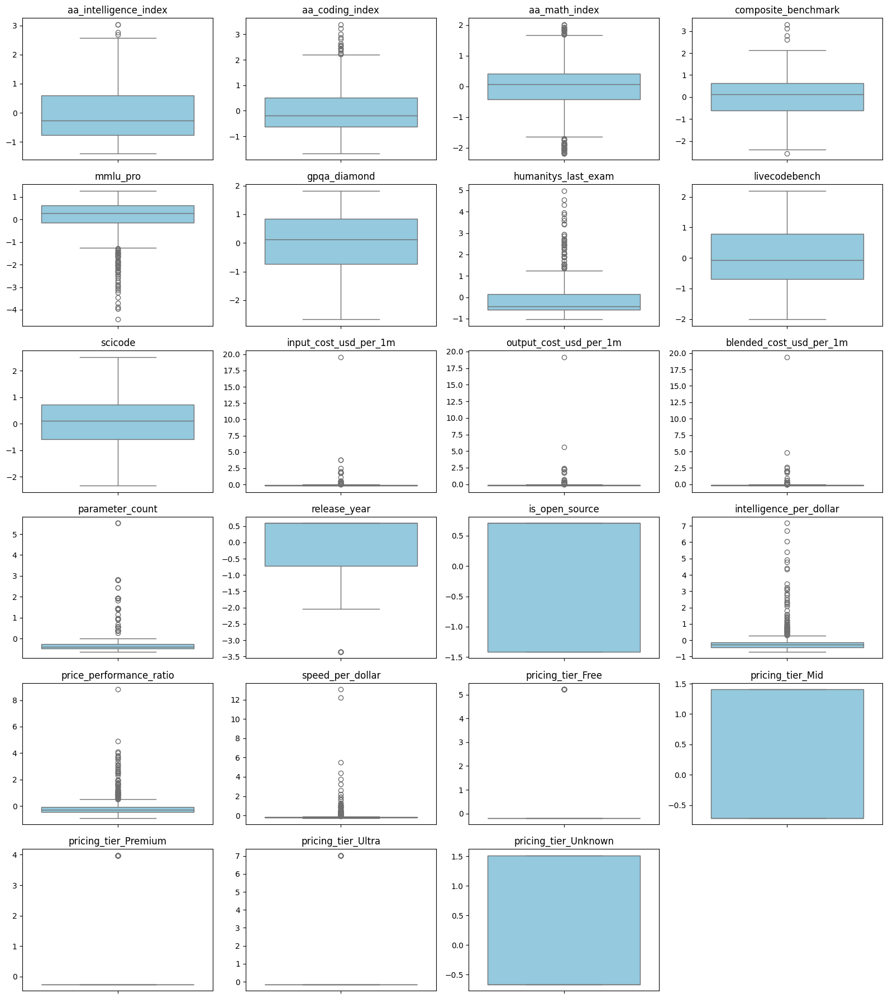

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# 1. Filtramos solo las columnas que realmente están en el dataset final (df_encoded)
cols_a_visualizar = [col for col in current_numerical_variables if col in df_encoded.columns]

print(f"Visualizando {len(cols_a_visualizar)} variables numéricas estandarizadas:\n")

num_plots = len(cols_a_visualizar)
n_cols = 4
n_rows = math.ceil(num_plots / n_cols)

plt.figure(figsize=(n_cols * 4, n_rows * 3))

for i, col in enumerate(cols_a_visualizar):
    plt.subplot(n_rows, n_cols, i + 1)
    # Usamos df_encoded para ver los datos ya normalizados
    sns.boxplot(y=df_encoded[col], color='skyblue')
    plt.title(f'{col}')
    plt.ylabel('')

plt.tight_layout()
plt.show()

--- Generando EDA Profesional ---


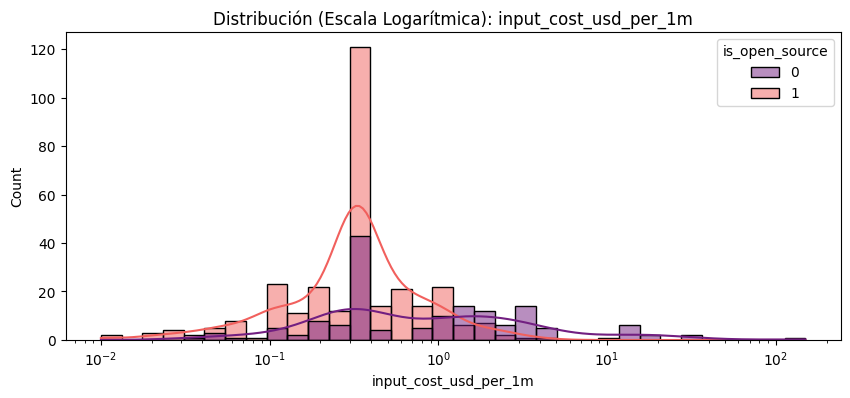

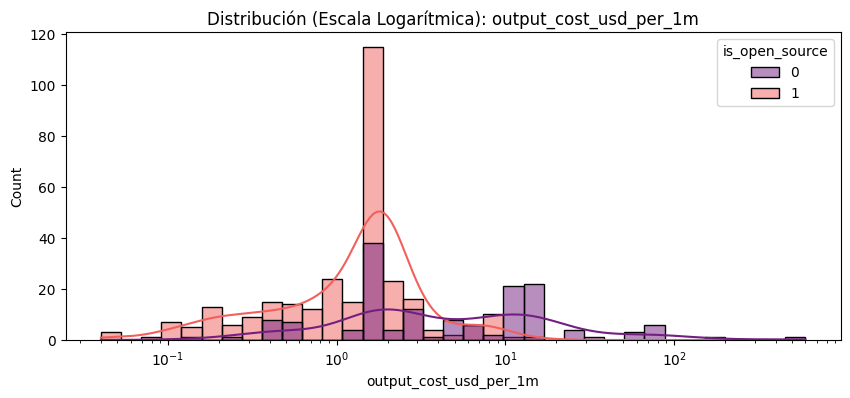

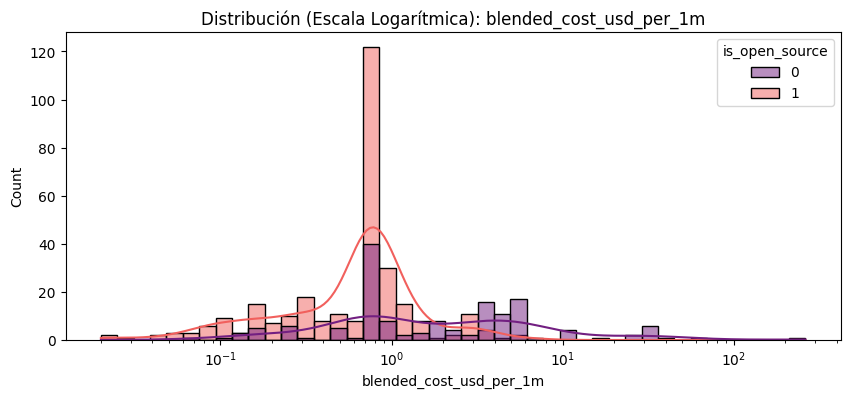

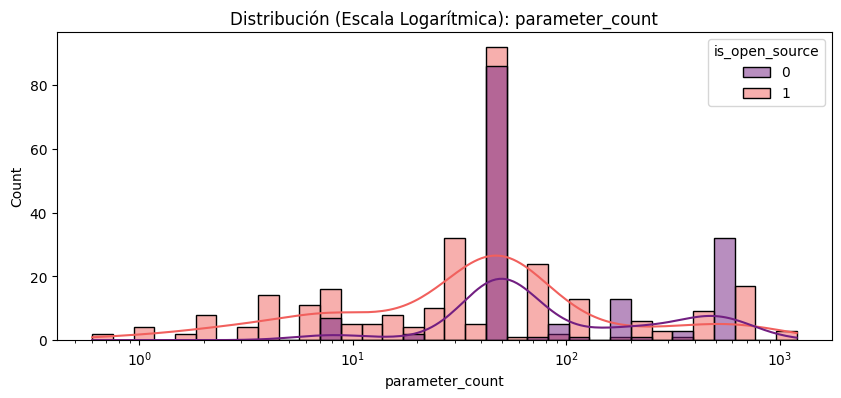

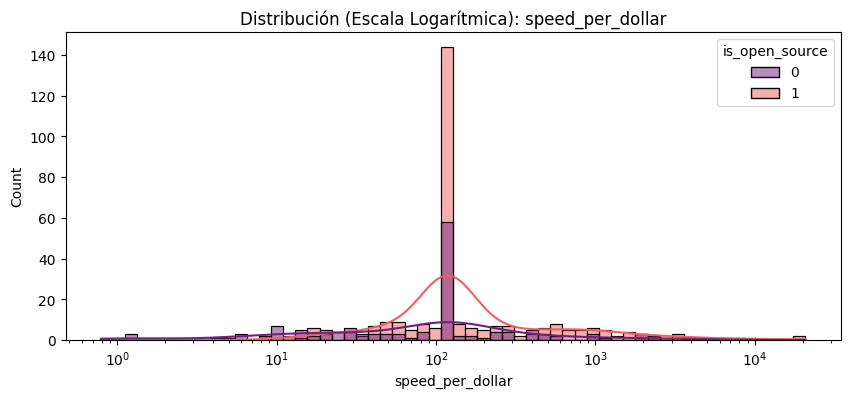

...

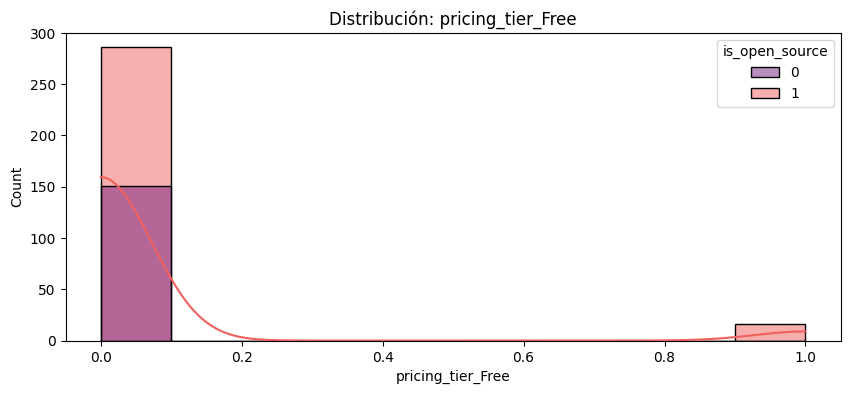

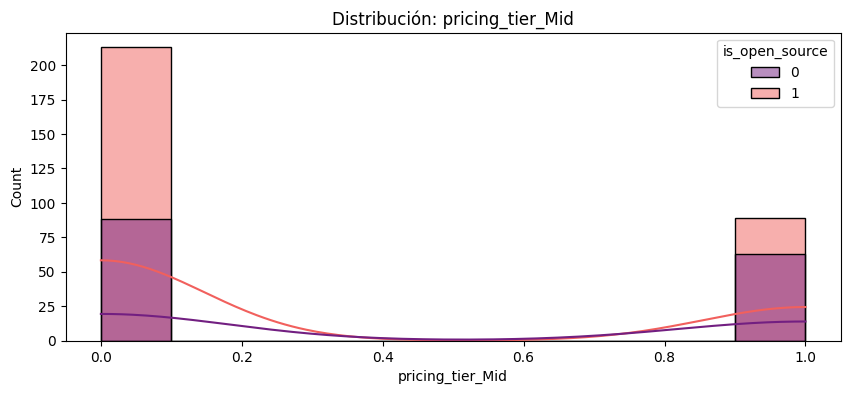

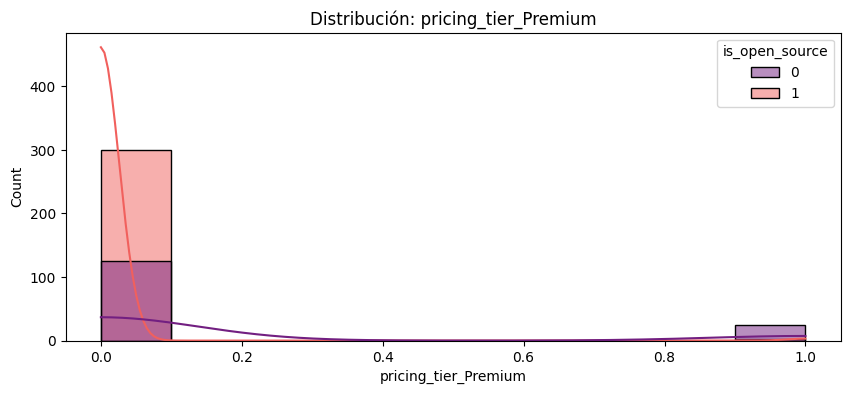

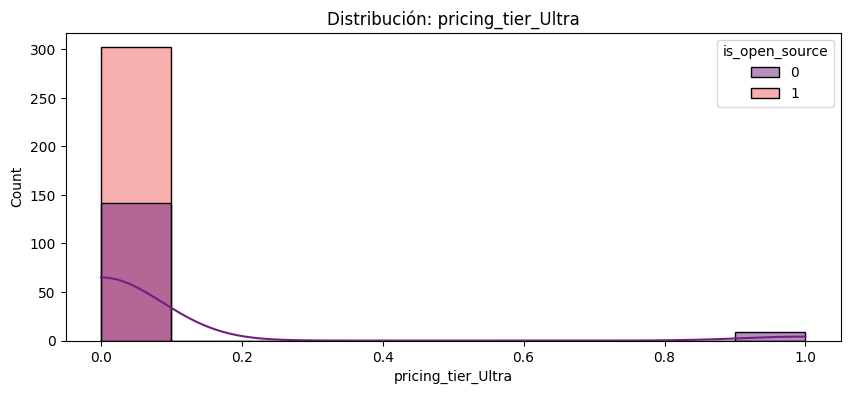

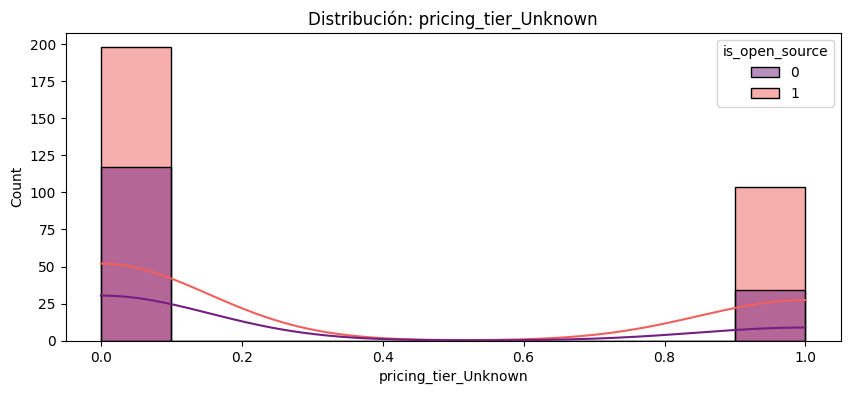

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Definimos qué variables tienen alta dispersión (precios, parámetros, velocidad)
# Esto evita el problema de las gráficas "aplastadas"
cols_continuas_log = [col for col in current_numerical_variables
                      if any(x in col for x in ['cost', 'parameter', 'speed', 'elo'])]

# 2. Definimos las variables que son normales (índices o años)
cols_normales = [col for col in current_numerical_variables if col not in cols_continuas_log]

segmento = 'is_open_source'

print("--- Generando EDA Profesional ---")

# --- BLOQUE A: Variables Continuas (con escala logarítmica para ver los outliers) ---
for col in cols_continuas_log:
    plt.figure(figsize=(10, 4))
    # Pre-process the column data for logarithmic plotting
    # Add a small constant (e.g., 1) to values that are zero or negative
    # to avoid -inf or NaN when log_scale is applied.
    x_data_for_plot = df_limpio[col].apply(lambda x: x + 1 if x <= 0 else x)
    sns.histplot(data=df_limpio, x=x_data_for_plot, hue=segmento, kde=True, log_scale=True, palette='magma')
    plt.title(f'Distribución (Escala Logarítmica): {col}')
    plt.show()

# --- BLOQUE B: Variables Normales (índices, años) ---
for col in cols_normales:
    plt.figure(figsize=(10, 4))
    sns.histplot(data=df_limpio, x=col, hue=segmento, kde=True, palette='magma')
    plt.title(f'Distribución: {col}')
    plt.show()

# 10. Eliminación de outliers (NO APLICA)

Si eliminas esos outliers: Estás eliminando precisamente a los modelos que mejor desempeño tienen. Tu modelo de ML resultante será "bueno detectando modelos promedio", pero incapaz de predecir o reconocer el éxito de los modelos de vanguardia.

In [63]:
# # --- Paso 5: Eliminación de Outliers vía IQR ---
# # Usamos df_encoded ya escalado

# df_sin_outliers = df_encoded.copy()

# # Definimos el factor (1.5 es el estándar, 3.0 es más permisivo)
# factor = 1.5

# for col in cols_a_visualizar: # Usamos la lista que ya filtramos antes
#     Q1 = df_sin_outliers[col].quantile(0.25)
#     Q3 = df_sin_outliers[col].quantile(0.75)
#     IQR = Q3 - Q1

#     limite_inferior = Q1 - factor * IQR
#     limite_superior = Q3 + factor * IQR

#     # Filtramos las filas que están fuera de los límites
#     df_sin_outliers = df_sin_outliers[
#         (df_sin_outliers[col] >= limite_inferior) &
#         (df_sin_outliers[col] <= limite_superior)
#     ]

# print(f"Original: {df_encoded.shape[0]} registros.")
# print(f"Tras eliminar outliers: {df_sin_outliers.shape[0]} registros.")
# print(f"Registros eliminados: {df_encoded.shape[0] - df_sin_outliers.shape[0]}")

Visualizando histogramas para 23 variables numéricas estandarizadas:



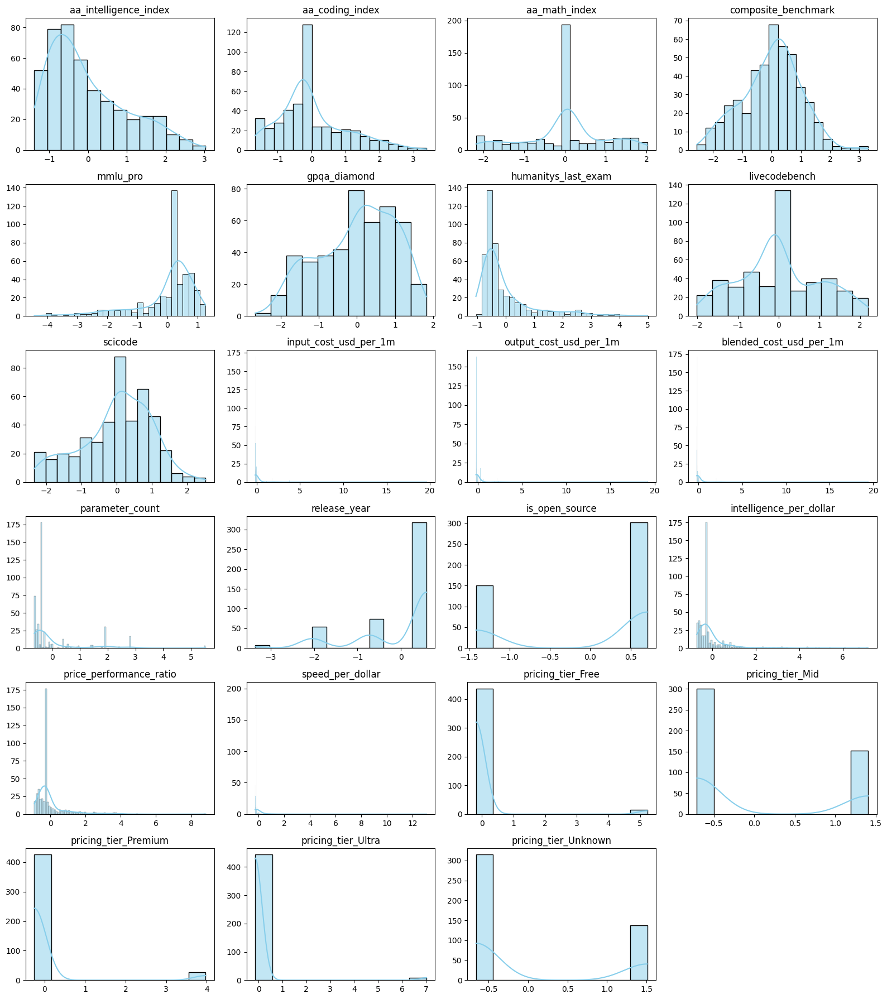

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# 1. Filtramos solo las columnas que realmente están en el dataset final (df_encoded)
cols_a_visualizar_hist = [col for col in current_numerical_variables if col in df_encoded.columns and col != target]

print(f"Visualizando histogramas para {len(cols_a_visualizar_hist)} variables numéricas estandarizadas:\n")

num_plots = len(cols_a_visualizar_hist)
n_cols = 4
n_rows = math.ceil(num_plots / n_cols)

plt.figure(figsize=(n_cols * 4, n_rows * 3))

for i, col in enumerate(cols_a_visualizar_hist):
    plt.subplot(n_rows, n_cols, i + 1)
    # Usamos df_encoded para ver los datos ya normalizados
    sns.histplot(df_encoded[col], kde=True, color='skyblue')
    plt.title(f'{col}')
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

Histogramas

Matriz de dispersión

Generando matriz de dispersión (Pair Plot) para las variables numéricas...


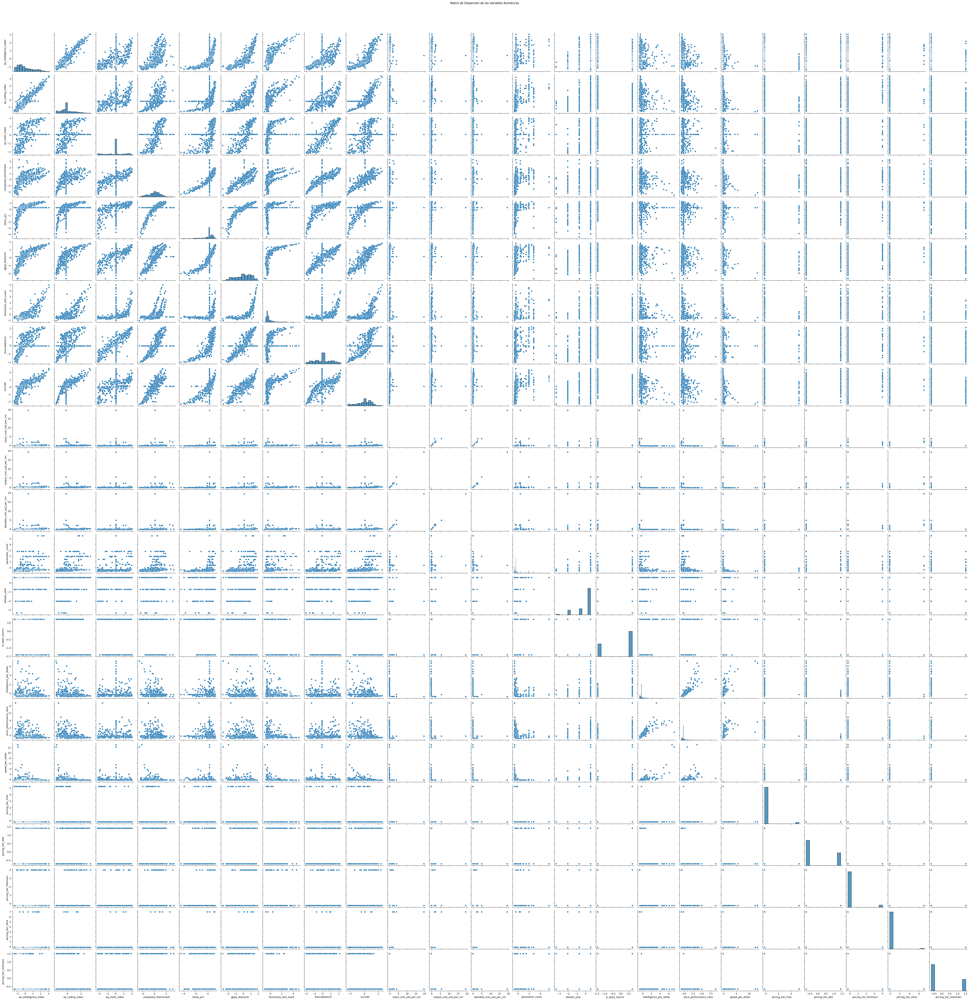

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

print("Generando matriz de dispersión (Pair Plot) para las variables numéricas...")

# Aseguramos que solo usamos las variables numéricas finales y escaladas
# current_numerical_variables ya está definido y contiene las columnas de df_encoded

# Generar el pair plot
sns.pairplot(df_encoded[current_numerical_variables])
plt.suptitle('Matriz de Dispersión de las Variables Numéricas', y=1.02) # Título general
plt.show()

Matriz de Correlación

Calculando la matriz de correlación optimizada en df_encoded:



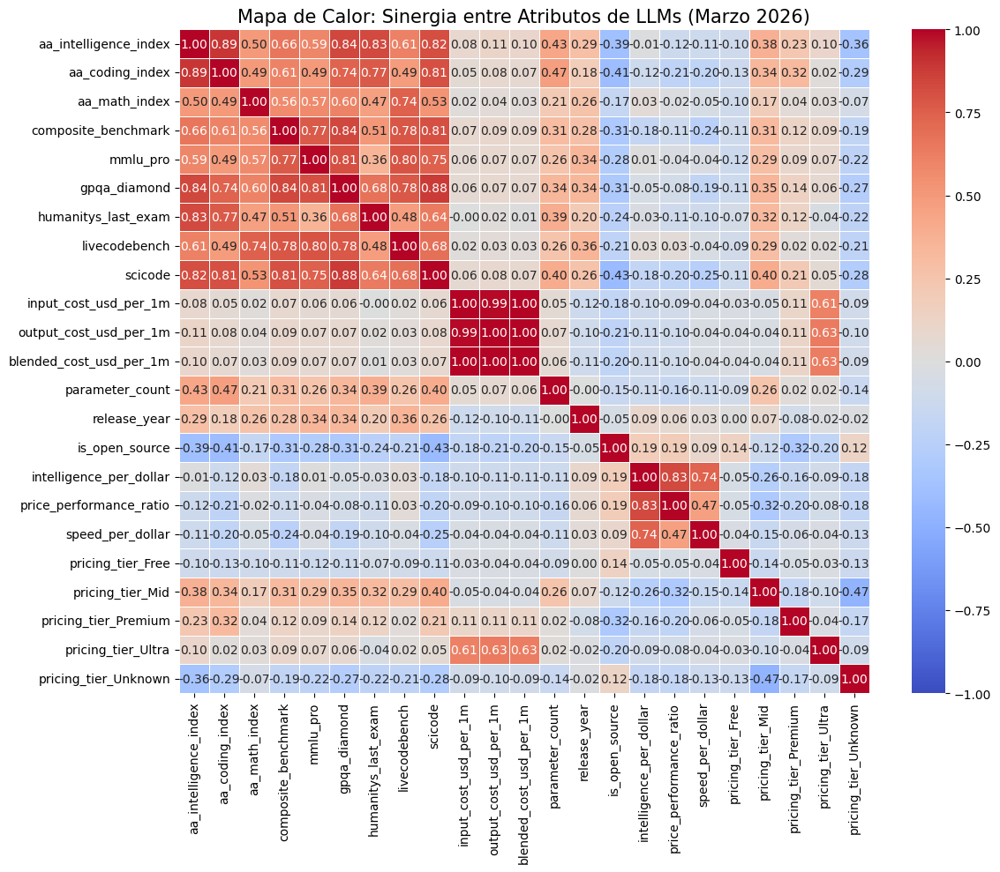

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

print("Calculando la matriz de correlación optimizada en df_encoded:\n")

# 1. Aseguramos que solo usamos variables que realmente aportan al análisis
# Evitamos meter el 'target' si ya lo analizamos en el bloque anterior para no repetir
# o lo incluimos para ver la visión global.
cols_interes = [col for col in current_numerical_variables if col in df_encoded.columns]

# 2. Calculamos la matriz usando df_encoded
correlation_matrix = df_encoded[cols_interes].corr()

# 3. Configuración estética del Heatmap
plt.figure(figsize=(12, 10))

# Usamos un mapa de color Divergente (coolwarm) para distinguir
# claramente correlaciones positivas (rojo) de negativas (azul)
sns.heatmap(
    correlation_matrix,
    annot=True,          # Muestra los números
    cmap='coolwarm',     # Estilo profesional
    fmt=".2f",           # Dos decimales
    linewidths=.5,       # Separación entre cuadros
    vmin=-1, vmax=1,     # Asegura que la escala siempre sea de -1 a 1
    center=0             # El blanco será el 0 (sin correlación)
)

plt.title('Mapa de Calor: Sinergia entre Atributos de LLMs (Marzo 2026)', fontsize=15)
plt.tight_layout()
plt.show()

In [67]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd # Ensure pandas is imported if not already

print("Aplicando MinMaxScaler exclusivamente a variables numéricas...")

# 1. Crear el escalador
scaler = MinMaxScaler()

# 2. Seleccionar solo las numéricas de df_limpio que deben ser escaladas
# Esto incluye float64 y int64, excluyendo el target 'Uso_Recomendado'
cols_para_escalar = df_limpio.select_dtypes(include=['float64', 'int64']).columns.drop('Uso_Recomendado', errors='ignore').tolist()

# 3. Aplicar el escalador
df_scaled_values = scaler.fit_transform(df_limpio[cols_para_escalar])

# 4. Crear un DataFrame de resultados con los nombres de columnas originales
df_scaled = pd.DataFrame(df_scaled_values, columns=cols_para_escalar, index=df_limpio.index)

# 5. Unir las columnas no escaladas (e.g., one-hot encoded booleans and the target) con los valores escalados
cols_no_escaladas = [col for col in df_limpio.columns if col not in cols_para_escalar]

df_final_ml = pd.concat([df_limpio[cols_no_escaladas], df_scaled], axis=1)

print("✅ Normalización completada.")
print("\nPrimeras 5 filas del dataset escalado (con categorías):")
display(df_final_ml.head())

Aplicando MinMaxScaler exclusivamente a variables numéricas...
✅ Normalización completada.

Primeras 5 filas del dataset escalado (con categorías):


,Uso_Recomendado,pricing_tier_Free,pricing_tier_Mid,pricing_tier_Premium,pricing_tier_Ultra,pricing_tier_Unknown,aa_intelligence_index,aa_coding_index,aa_math_index,composite_benchmark,...,scicode,input_cost_usd_per_1m,output_cost_usd_per_1m,blended_cost_usd_per_1m,parameter_count,release_year,is_open_source,intelligence_per_dollar,price_performance_ratio,speed_per_dollar
0,0,False,False,True,False,False,1.000000,1.000000,0.533333,0.649507,...,0.960951,0.016667,0.025000,0.021429,0.416375,1.000000,0.0,0.019185,0.021138,0.000731
1,0,False,True,False,False,False,1.000000,0.968586,0.533333,0.676889,...,1.000000,0.013333,0.020000,0.017143,0.040354,1.000000,0.0,0.024024,0.025694,0.001250
2,0,False,True,False,False,False,0.939048,0.926702,0.533333,0.629025,...,0.903226,0.011667,0.023333,0.018335,0.416375,1.000000,0.0,0.021185,0.022408,0.000879
3,0,False,False,True,False,False,0.920000,0.839442,0.533333,0.605696,...,0.881154,0.033333,0.041667,0.038095,0.040354,0.666667,0.0,0.009907,0.013358,0.000254
4,0,False,False,True,False,False,0.895238,0.888307,0.533333,0.554984,...,0.794567,0.020000,0.025000,0.022857,0.040354,0.666667,0.0,0.016232,0.016351,0.000584


19 y 20 Partición de datos

In [68]:
from sklearn.model_selection import train_test_split

# 1. Definir X (features) e y (target)
# Nota: Asegúrate de excluir 'Uso_Recomendado' de X porque es lo que queremos predecir
X = df_encoded.drop('Uso_Recomendado', axis=1)
y = df_encoded['Uso_Recomendado']

# 2. Partición con estratificación
# 'stratify=y' es un truco de ingeniero: asegura que tanto en Train como en Test
# haya la misma proporción de modelos recomendados vs no recomendados.
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Dimensiones de entrenamiento: {X_train.shape}")
print(f"Dimensiones de prueba: {X_test.shape}")

Dimensiones de entrenamiento: (362, 23)
Dimensiones de prueba: (91, 23)


In [69]:
!pip install lazypredict


import pandas as pd
import numpy as np
from lazypredict.Supervised import LazyClassifier

print("🚀 Iniciando competencia de algoritmos con datos blindados...")

# 1. Filtro de seguridad: Solo números
# Esto garantiza que LazyPredict no falle si se coló un ID o nombre
X_train_final = X_train.select_dtypes(include=[np.number]).copy()
X_test_final = X_test.select_dtypes(include=[np.number]).copy()

# 2. Limpieza de nombres de columnas
X_train_final.columns = [str(c).replace(' ', '_').replace('.', '_') for c in X_train_final.columns]
X_test_final.columns = [str(c).replace(' ', '_').replace('.', '_') for c in X_test_final.columns]

# 3. Sincronizar 'y' con los índices de 'X' (por si acaso hubo caídas en el paso anterior)
y_train_final = y_train.loc[X_train_final.index]
y_test_final = y_test.loc[X_test_final.index]

print(f"📊 Variables a evaluar ({X_train_final.shape[1]}): {X_train_final.columns.tolist()}")

# 4. Ejecutar LazyPredict
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models_real, predictions_real = clf.fit(X_train_final, X_test_final, y_train_final, y_test_final)

# 5. Mostrar resultados
if not models_real.empty:
    print("\n🏆 RESULTADOS):")
    display(models_real.head(10))
else:
    print("❌ La tabla salió vacía. Ejecuta: print(X_train_final.dtypes) para ver qué falló.")






🚀 Iniciando competencia de algoritmos con datos blindados...
📊 Variables a evaluar (23): ['aa_intelligence_index', 'aa_coding_index', 'aa_math_index', 'composite_benchmark', 'mmlu_pro', 'gpqa_diamond', 'humanitys_last_exam', 'livecodebench', 'scicode', 'input_cost_usd_per_1m', 'output_cost_usd_per_1m', 'blended_cost_usd_per_1m', 'parameter_count', 'release_year', 'is_open_source', 'intelligence_per_dollar', 'price_performance_ratio', 'speed_per_dollar', 'pricing_tier_Free', 'pricing_tier_Mid', 'pricing_tier_Premium', 'pricing_tier_Ultra', 'pricing_tier_Unknown']

🏆 RESULTADOS):


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Precision,Recall,Time Taken
Model,,,,,,,
LGBMClassifier,0.945055,0.932405,0.977812,0.944491,0.946189,0.945055,0.065796
XGBClassifier,0.923077,0.908927,0.969040,0.922288,0.923697,0.923077,0.088431
AdaBoostClassifier,0.879121,0.873839,0.940918,0.879462,0.880024,0.879121,0.163972
BaggingClassifier,0.879121,0.867905,0.964654,0.878744,0.878593,0.879121,0.072871
DecisionTreeClassifier,0.835165,0.838751,0.838751,0.837029,0.843970,0.835165,0.037105
QuadraticDiscriminantAnalysis,0.813187,0.815273,0.887513,0.815300,0.822344,0.813187,0.022381
LinearDiscriminantAnalysis,0.791209,0.773994,0.859133,0.790558,0.790106,0.791209,0.031225
CalibratedClassifierCV,0.780220,0.759288,0.867389,0.778784,0.778136,0.780220,0.070126
LogisticRegression,0.780220,0.759288,0.865841,0.778784,0.778136,0.780220,0.039726


KNN

In [70]:
from sklearn.neighbors import KNeighborsClassifier

print("Initializing and training KNeighborsClassifier model...")

# Instantiate the KNeighborsClassifier model
# Using n_neighbors=5 as a common starting point
knn_model = KNeighborsClassifier(n_neighbors=5)

# Train the KNN model using the training data
knn_model.fit(X_train, y_train)

print("KNeighborsClassifier model trained successfully.")

Initializing and training KNeighborsClassifier model...
KNeighborsClassifier model trained successfully.


Métricas

Evaluating KNN model performance...

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.86      0.81        57
           1       0.70      0.56      0.62        34

    accuracy                           0.75        91
   macro avg       0.73      0.71      0.72        91
weighted avg       0.74      0.75      0.74        91


Confusion Matrix:


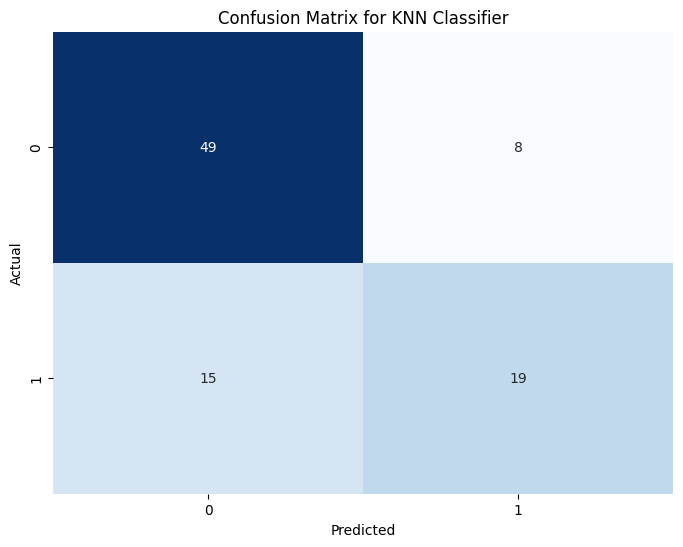

KNN model evaluation complete.


In [71]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

print("Evaluating KNN model performance...")

# Make predictions on the test set
y_pred = knn_model.predict(X_test)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Generate and display confusion matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=knn_model.classes_, yticklabels=knn_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for KNN Classifier')
plt.show()

print("KNN model evaluation complete.")

Naive Bayes

Initializing and training Gaussian Naive Bayes model...
Gaussian Naive Bayes model trained successfully.
Evaluating Gaussian Naive Bayes model performance...

Classification Report (Gaussian Naive Bayes):
              precision    recall  f1-score   support

           0       0.77      0.75      0.76        57
           1       0.60      0.62      0.61        34

    accuracy                           0.70        91
   macro avg       0.68      0.69      0.68        91
weighted avg       0.71      0.70      0.70        91


Confusion Matrix (Gaussian Naive Bayes):


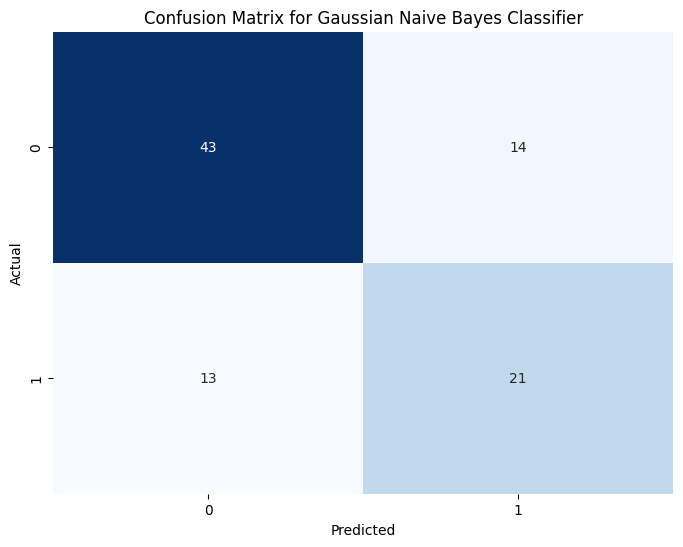

In [72]:
from sklearn.naive_bayes import GaussianNB

print("Initializing and training Gaussian Naive Bayes model...")

# Instantiate the Gaussian Naive Bayes model
gnb_model = GaussianNB()

# Train the GNB model using the training data
gnb_model.fit(X_train, y_train)

print("Gaussian Naive Bayes model trained successfully.")

from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

print("Evaluating Gaussian Naive Bayes model performance...")

# Make predictions on the test set
y_pred_gnb = gnb_model.predict(X_test)

# Display classification report
print("\nClassification Report (Gaussian Naive Bayes):")
print(classification_report(y_test, y_pred_gnb))

# Generate and display confusion matrix
print("\nConfusion Matrix (Gaussian Naive Bayes):")
cm_gnb = confusion_matrix(y_test, y_pred_gnb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_gnb, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=gnb_model.classes_, yticklabels=gnb_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gaussian Naive Bayes Classifier')
plt.show()

Arboles de decisión

Initializing and training Decision Tree Classifier model...
Decision Tree Classifier model trained successfully.
Evaluating Decision Tree Classifier model performance...

Classification Report (Decision Tree Classifier):
              precision    recall  f1-score   support

           0       0.90      0.82      0.86        57
           1       0.74      0.85      0.79        34

    accuracy                           0.84        91
   macro avg       0.82      0.84      0.83        91
weighted avg       0.84      0.84      0.84        91


Confusion Matrix (Decision Tree Classifier):


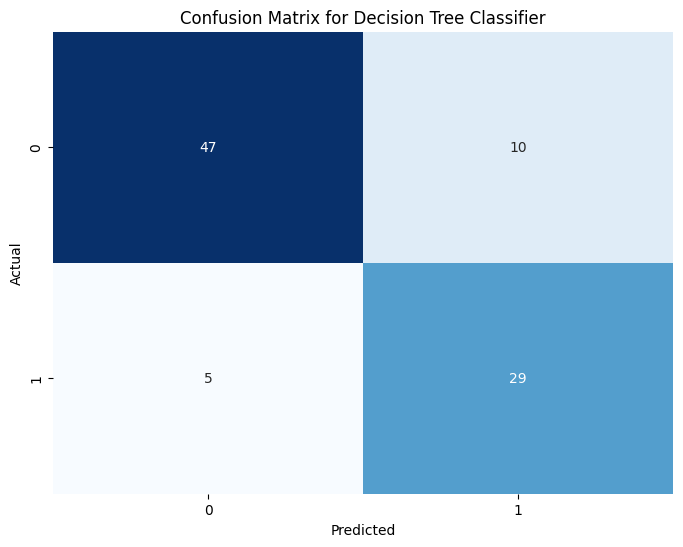

In [73]:
from sklearn.tree import DecisionTreeClassifier

print("Initializing and training Decision Tree Classifier model...")

# Instantiate the DecisionTreeClassifier model
dt_model = DecisionTreeClassifier(random_state=42) # Added random_state for reproducibility

# Train the Decision Tree model using the training data
dt_model.fit(X_train, y_train)

print("Decision Tree Classifier model trained successfully.")

from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

print("Evaluating Decision Tree Classifier model performance...")

# Make predictions on the test set
y_pred_dt = dt_model.predict(X_test)

# Display classification report
print("\nClassification Report (Decision Tree Classifier):")
print(classification_report(y_test, y_pred_dt))

# Generate and display confusion matrix
print("\nConfusion Matrix (Decision Tree Classifier):")
cm_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=dt_model.classes_, yticklabels=dt_model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

Arbol de decisión

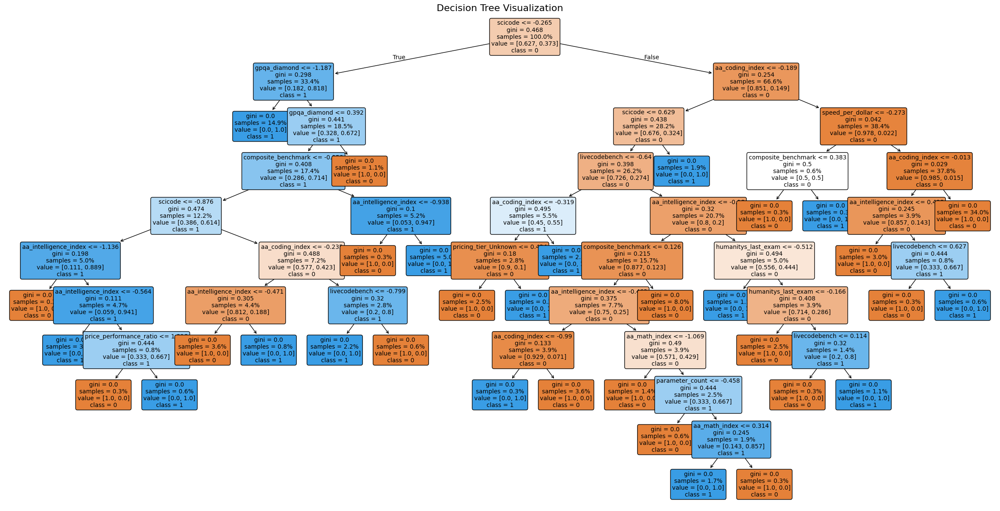

In [74]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(30,15))  # Más grande = más espacio entre nodos

plot_tree(
    dt_model,
    feature_names=X_test.columns,
    class_names=dt_model.classes_.astype(str),
    filled=True,
    rounded=True,          # Bordes redondeados (mejor visual)
    fontsize=10,           # Reduce texto para evitar saturación
    proportion=True        # Ajusta tamaños proporcionalmente
)

plt.title("Decision Tree Visualization", fontsize=16)
plt.savefig("decision_tree.png", dpi=300, bbox_inches='tight')  # Mejor calidad
plt.show()

In [75]:
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(
    dt_model,
    out_file=None,
    feature_names=X_test.columns,
    class_names=dt_model.classes_.astype(str),
    filled=True,
    rounded=True,
    special_characters=True
)

# Agregar etiquetas a ramas
dot_data = dot_data.replace('labeldistance=2.5', 'labeldistance=2.5, labelangle=45')

# Truco: etiquetar manualmente las ramas
dot_data = dot_data.replace('headlabel="True"', 'headlabel="True"')
dot_data = dot_data.replace('headlabel="False"', 'headlabel="False"')

graph = graphviz.Source(dot_data)
graph.render("decision_tree_labeled", format="png")

'decision_tree_labeled.png'

Normalización de datos

Random Forest

Evaluating Random Forest Classifier model performance...

Classification Report (Random Forest Classifier):
              precision    recall  f1-score   support

           0       0.79      0.88      0.83        57
           1       0.75      0.62      0.68        34

    accuracy                           0.78        91
   macro avg       0.77      0.75      0.76        91
weighted avg       0.78      0.78      0.78        91


Confusion Matrix (Random Forest Classifier):


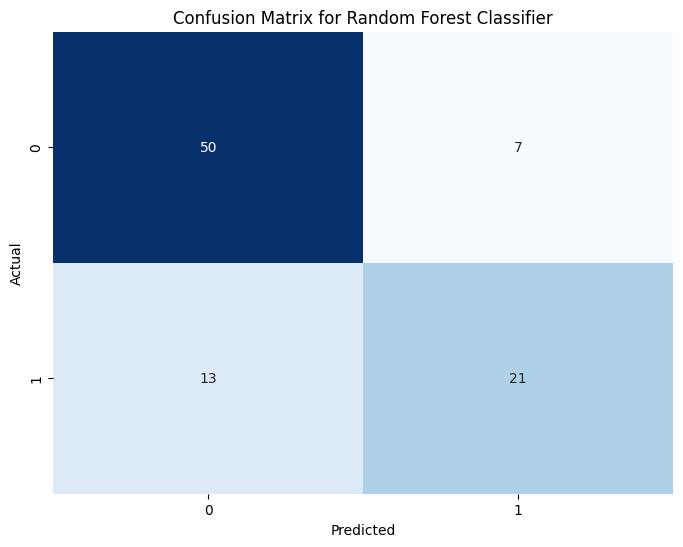

In [76]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

print("Evaluating Random Forest Classifier model performance...")
from sklearn.ensemble import RandomForestClassifier

# Crear el modelo
rf_model = RandomForestClassifier(
    n_estimators=100,   # número de árboles
    random_state=42
)

# Entrenar el modelo
rf_model.fit(X_train, y_train)
# Make predictions on the test set
y_pred_rf = rf_model.predict(X_test)

# Display classification report
print("\nClassification Report (Random Forest Classifier):")
print(classification_report(y_test, y_pred_rf))

# Generate and display confusion matrix
print("\nConfusion Matrix (Random Forest Classifier):")
cm_rf = confusion_matrix(y_test, y_pred_rf)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_rf,
    annot=True,
    fmt='d',
    cmap='Blues',
    cbar=False,
    xticklabels=rf_model.classes_,
    yticklabels=rf_model.classes_
)

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

XGBoost

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [05:38:02] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Evaluating XGBoost Classifier model performance...

Classification Report (XGBoost Classifier):
              precision    recall  f1-score   support

           0       0.88      0.98      0.93        57
           1       0.96      0.76      0.85        34

    accuracy                           0.90        91
   macro avg       0.92      0.87      0.89        91
weighted avg       0.91      0.90      0.90        91


Confusion Matrix (XGBoost Classifier):


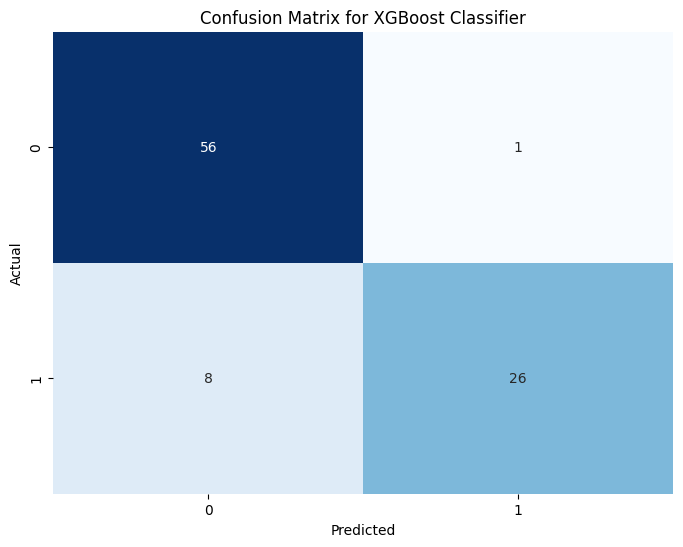

XGBoost Classifier model evaluation complete.


In [77]:
from xgboost import XGBClassifier

# Crear modelo
xgb_model = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=5,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

# Entrenar
xgb_model.fit(X_train, y_train)

from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

print("Evaluating XGBoost Classifier model performance...")

# Predicciones
y_pred_xgb = xgb_model.predict(X_test)

# Reporte
print("\nClassification Report (XGBoost Classifier):")
print(classification_report(y_test, y_pred_xgb))

# Matriz de confusión
print("\nConfusion Matrix (XGBoost Classifier):")
cm_xgb = confusion_matrix(y_test, y_pred_xgb)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_xgb,
    annot=True,
    fmt='d',
    cmap='Blues',
    cbar=False,
    xticklabels=xgb_model.classes_,
    yticklabels=xgb_model.classes_
)

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for XGBoost Classifier')
plt.show()

print("XGBoost Classifier model evaluation complete.")

BoxPlots

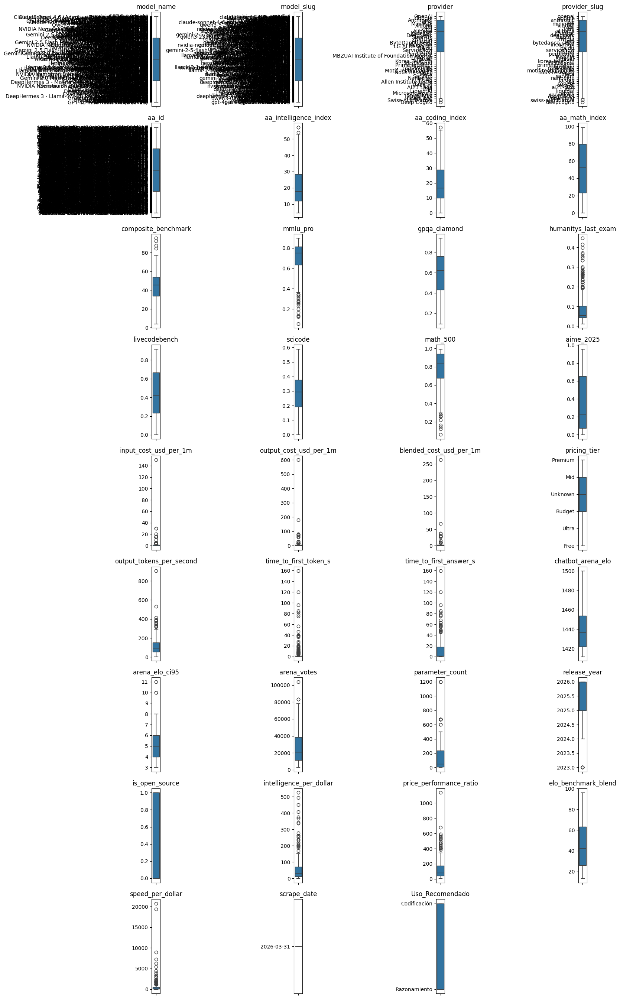

In [78]:
import matplotlib.pyplot as plt
import seaborn as sns

# Obtener el número de columnas para determinar el tamaño de la figura
num_cols = len(df.columns)

# Calcular el número de filas y columnas para la cuadrícula de subplots
# Se puede ajustar el número de columnas de la cuadrícula, por ejemplo, 4 o 5
n_cols_subplot = 4
n_rows_subplot = (num_cols + n_cols_subplot - 1) // n_cols_subplot

# Crear la figura y los subplots
fig, axes = plt.subplots(n_rows_subplot, n_cols_subplot, figsize=(n_cols_subplot * 4, n_rows_subplot * 3))
axes = axes.flatten() # Aplanar el array de axes para fácil iteración

# Generar un boxplot para cada columna
for i, col in enumerate(df.columns):
    if i < len(axes): # Asegurarse de no exceder el número de subplots
        sns.boxplot(y=df[col], ax=axes[i])
        axes[i].set_title(col)
        axes[i].set_ylabel('') # Eliminar la etiqueta del eje y para mayor claridad

# Ocultar los ejes de los subplots vacíos si los hubiera
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

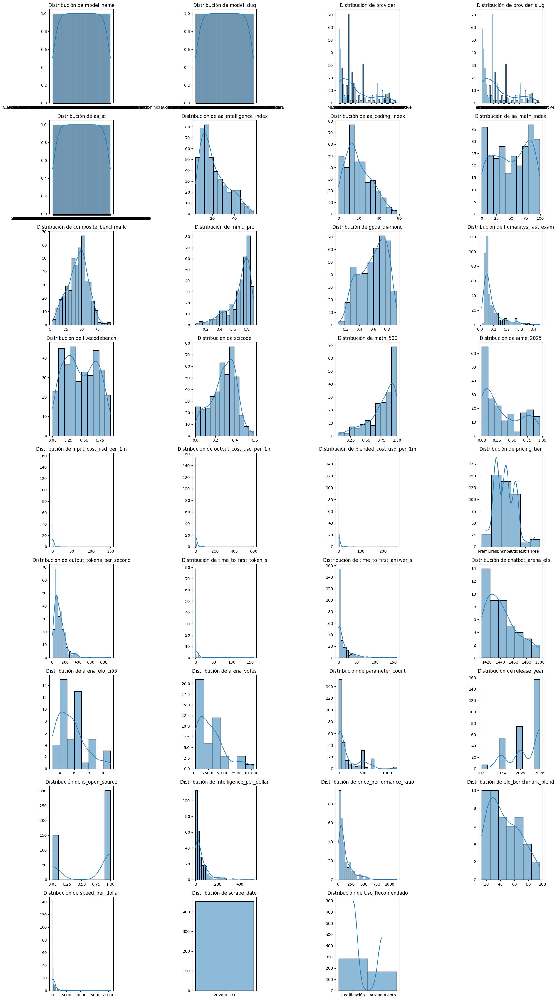

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns

# Obtener el número de columnas para determinar el tamaño de la figura
num_cols = len(df.columns)

# Calcular el número de filas y columnas para la cuadrícula de subplots
n_cols_subplot = 4 # Puedes ajustar el número de columnas de la cuadrícula
n_rows_subplot = (num_cols + n_cols_subplot - 1) // n_cols_subplot

# Crear la figura y los subplots
fig, axes = plt.subplots(n_rows_subplot, n_cols_subplot, figsize=(n_cols_subplot * 5, n_rows_subplot * 4))
axes = axes.flatten() # Aplanar el array de axes para fácil iteración

# Generar un histograma con KDE para cada columna
for i, col in enumerate(df.columns):
    if i < len(axes): # Asegurarse de no exceder el número de subplots
        sns.histplot(df[col], kde=True, ax=axes[i])
        axes[i].set_title(f'Distribución de {col}')
        axes[i].set_xlabel('') # Eliminar la etiqueta del eje x para mayor claridad
        axes[i].set_ylabel('') # Eliminar la etiqueta del eje y para mayor claridad

# Ocultar los ejes de los subplots vacíos si los hubiera
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Bivariado

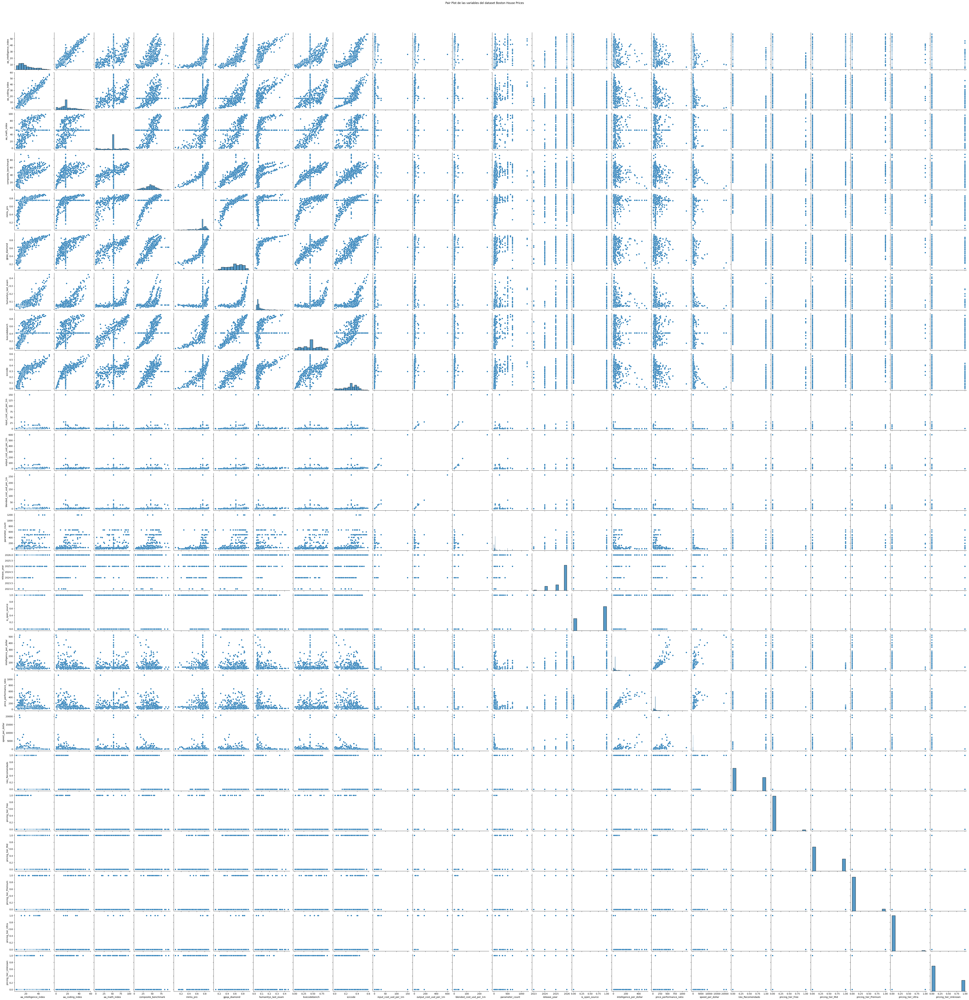

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

# Generar el pair plot
sns.pairplot(df_limpio)
plt.suptitle('Pair Plot de las variables del dataset Boston House Prices', y=1.02) # Título general
plt.show()

/tmp/ipykernel_10221/2352230268.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importancia', y='Variable', data=importances.head(10), palette='magma')


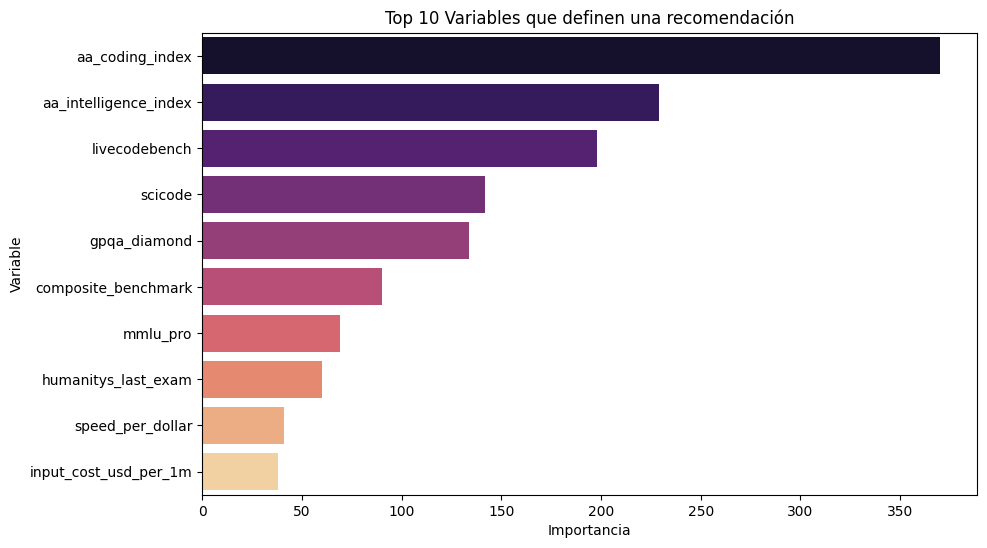

In [81]:
from lightgbm import LGBMClassifier
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Entrenar el modelo ganador con todo el set de entrenamiento
best_model = LGBMClassifier(random_state=42)
best_model.fit(X_train, y_train)

# 2. Obtener la importancia de las características
importances = pd.DataFrame({
    'Variable': X.columns,
    'Importancia': best_model.feature_importances_
}).sort_values(by='Importancia', ascending=False)

# 3. Visualizar qué variables definen tu "Uso_Recomendado"
plt.figure(figsize=(10, 6))
sns.barplot(x='Importancia', y='Variable', data=importances.head(10), palette='magma')
plt.title('Top 10 Variables que definen una recomendación')
plt.show()

Evaluating LGBMClassifier model performance...

Classification Report (LGBMClassifier):
              precision    recall  f1-score   support

           0       0.93      0.96      0.95        57
           1       0.94      0.88      0.91        34

    accuracy                           0.93        91
   macro avg       0.93      0.92      0.93        91
weighted avg       0.93      0.93      0.93        91


Confusion Matrix (LGBMClassifier):


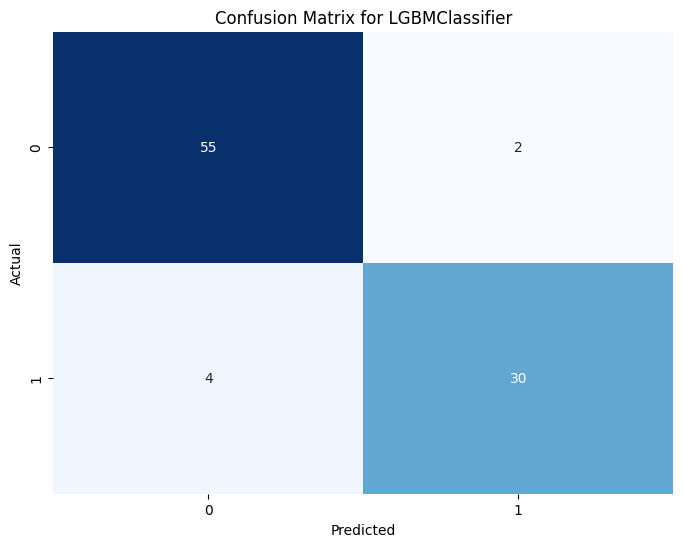

LGBMClassifier model evaluation complete.


In [82]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

print("Evaluating LGBMClassifier model performance...")

# Make predictions on the test set using the best_model (LGBMClassifier)
y_pred_lgbm = best_model.predict(X_test)

# Display classification report
print("\nClassification Report (LGBMClassifier):")
print(classification_report(y_test, y_pred_lgbm))

# Generate and display confusion matrix
print("\nConfusion Matrix (LGBMClassifier):")
cm_lgbm = confusion_matrix(y_test, y_pred_lgbm)

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_lgbm,
    annot=True,
    fmt='d',
    cmap='Blues',
    cbar=False,
    xticklabels=best_model.classes_,
    yticklabels=best_model.classes_
)

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for LGBMClassifier')
plt.show()

print("LGBMClassifier model evaluation complete.")

Correlación

In [84]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, f1_score

# Lista de modelos a probar (diferentes familias)
modelos = {
    "RandomForest": RandomForestClassifier(n_estimators=100, random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42),
    "LogisticRegression": LogisticRegression(max_iter=1000),
    "SVC": SVC(probability=True),
    "DecisionTree": DecisionTreeClassifier()
}

resultados = []

print("--- Entrenando modelos comparativos ---")

for nombre, modelo in modelos.items():
    modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')

    resultados.append({"Modelo": nombre, "Accuracy": acc, "F1-Score": f1})
    print(f"✅ {nombre} entrenado.")

# Convertimos a DataFrame para visualizar el ganador comparado
df_resultados = pd.DataFrame(resultados).sort_values(by="Accuracy", ascending=False)
display(df_resultados)

--- Entrenando modelos comparativos ---
✅ RandomForest entrenado.
✅ GradientBoosting entrenado.
✅ LogisticRegression entrenado.
✅ SVC entrenado.
✅ DecisionTree entrenado.


,Modelo,Accuracy,F1-Score
1,GradientBoosting,0.879121,0.877881
4,DecisionTree,0.857143,0.858230
0,RandomForest,0.780220,0.775080
2,LogisticRegression,0.780220,0.778784
3,SVC,0.780220,0.770135


2. Matriz de Confusión Comparativa
Para no llenar el notebook de gráficas individuales, podemos poner las matrices de tus dos mejores modelos (ej. LGBM y XGBoost) una al lado de la otra para comparar dónde falla cada uno.

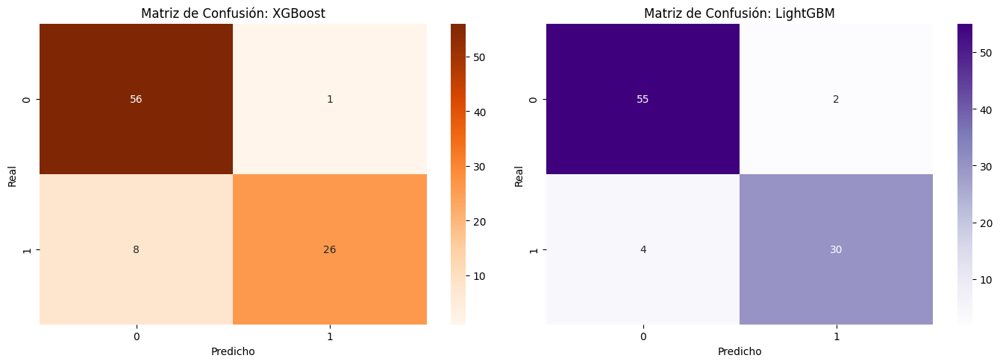

In [96]:
from sklearn.metrics import confusion_matrix

# Predicciones de tus dos mejores modelos
y_pred_lgbm = best_model.predict(X_test)
y_pred_xgb = xgb_model.predict(X_test) # Ajusta el nombre si es diferente

fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Matriz XGBoost
sns.heatmap(confusion_matrix(y_test, y_pred_xgb), annot=True, fmt='d', cmap='Oranges', ax=ax[0])
ax[0].set_title('Matriz de Confusión: XGBoost')
ax[0].set_xlabel('Predicho')
ax[0].set_ylabel('Real')

# Matriz LGBM
sns.heatmap(confusion_matrix(y_test, y_pred_lgbm), annot=True, fmt='d', cmap='Purples', ax=ax[1])
ax[1].set_title('Matriz de Confusión: LightGBM')
ax[1].set_xlabel('Predicho')
ax[1].set_ylabel('Real')


plt.tight_layout()
plt.show()

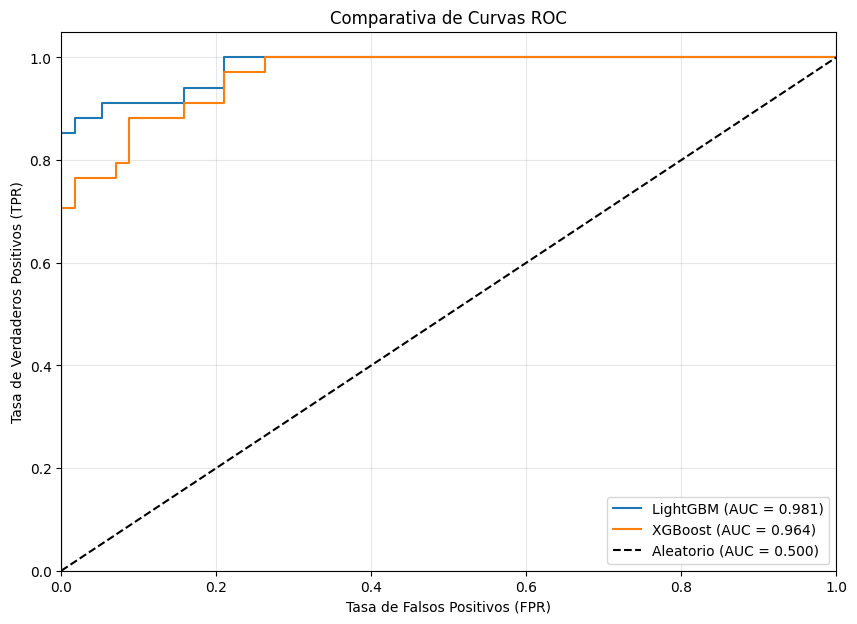

In [90]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 7))

# Graficar curva para cada modelo principal
for nombre, modelo in {"LightGBM": best_model, "XGBoost": xgb_model}.items():
    y_probs = modelo.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{nombre} (AUC = {roc_auc:.3f})')

# Línea base (aleatoria)
plt.plot([0, 1], [0, 1], 'k--', label='Aleatorio (AUC = 0.500)')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Comparativa de Curvas ROC')
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()

/tmp/ipykernel_10221/2118120904.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Cluster_Nicho'] = kmeans.fit_predict(X_scaled)


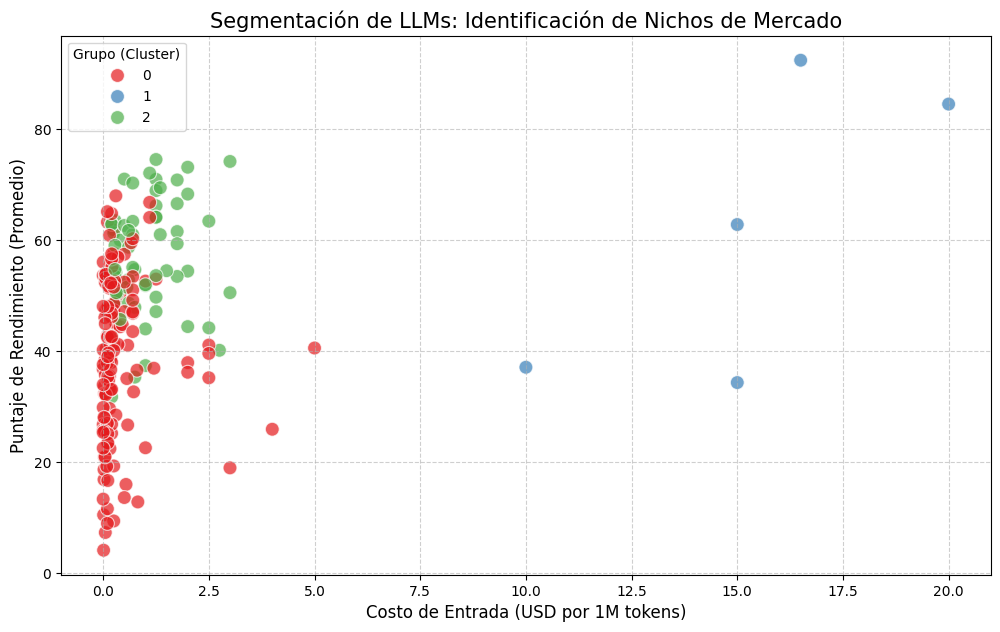

Resumen técnico por Cluster:
               input_cost_usd_per_1m  output_cost_usd_per_1m  \
Cluster_Nicho                                                  
0                           0.406957                1.685616   
1                          15.300000               62.200000   
2                           1.018047                5.715000   

               composite_benchmark  parameter_count  
Cluster_Nicho                                        
0                        38.734928        43.684058  
1                        62.214000       199.000000  
2                        56.420469       501.562500  


In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# 1. Cargar el dataset (Usa el archivo original antes del LabelEncoder)
df_clustering = pd.read_csv('llm_price_performance_tracker_2026-03-31.csv')

# 2. Selección de variables numéricas para el clustering
# Queremos agrupar por: Costo vs. Rendimiento vs. Capacidad
cols_to_use = [
    'input_cost_usd_per_1m',
    'output_cost_usd_per_1m',
    'composite_benchmark',  # Corregido: el promedio de rendimiento que calculamos
    'parameter_count'    # Corregido: la columna disponible para el tamaño del modelo
]

# Eliminamos filas con valores nulos en estas columnas para que el modelo no falle
df_clean = df_clustering.dropna(subset=cols_to_use)

# 3. Escalamiento (FUNDAMENTAL: K-Means usa distancias, si no escalas, el costo en $ opaca al benchmark)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[cols_to_use])

# 4. Aplicar K-Means
# Probamos con 3 clusters: "Económicos", "Balanceados" y "Premium"
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df_clean['Cluster_Nicho'] = kmeans.fit_predict(X_scaled)

# 5. Visualización de los Grupos
plt.figure(figsize=(12, 7))
sns.scatterplot(
    data=df_clean,
    x='input_cost_usd_per_1m',
    y='composite_benchmark',
    hue='Cluster_Nicho',
    palette='Set1',
    s=100,
    alpha=0.7
)

plt.title('Segmentación de LLMs: Identificación de Nichos de Mercado', fontsize=15)
plt.xlabel('Costo de Entrada (USD por 1M tokens)', fontsize=12)
plt.ylabel('Puntaje de Rendimiento (Promedio)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Grupo (Cluster)')
plt.show()

# 6. Ver el resumen de cada grupo
print("Resumen técnico por Cluster:")
print(df_clean.groupby('Cluster_Nicho')[cols_to_use].mean())